### Installation

In [1]:
!pipenv install matplotlib
!pipenv install plotly
!pipenv install sentence_transformers
!pipenv install umap-learn
!pipenv install hdbscan
!pipenv install joblib==1.1.0

Courtesy Notice: Pipenv found itself running within a virtual environment, so it will automatically use that environment, instead of creating its own for any project. You can set PIPENV_IGNORE_VIRTUALENVS=1 to force pipenv to ignore that environment and create its own instead. You can set PIPENV_VERBOSITY=-1 to suppress this warning.
Installing sentence_transformers...
Resolving sentence_transformers...
Installing...
Adding sentence_transformers to Pipfile's [packages] ...
✔ Installation Succeededce_transformers...
⠧ Installing sentence_transformers...
Pipfile.lock (ed3c53) out of date, updating to (8b205d)...
Locking [packages] dependencies...
Building requirements...
Resolving dependencies...
✔ Success! Locking...
⠦ Locking...
Locking [dev-packages] dependencies...
Updated Pipfile.lock (5707ed3afeb676b8a853ffe31c724dfaba4e379b9b01e2b1348da8775f8b205d)!
Installing dependencies from Pipfile.lock (8b205d)...
To activate this project's virtualenv, run pipenv shell.
Alternatively, run a c

### Imports

In [2]:
# General
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px
import capir_transfronteriza2_2023.data.load as load

# Topic modeling
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from sklearn.cluster import KMeans
from hdbscan import HDBSCAN

/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(

### Load data

In [3]:
data_processed = load.data_processed
assets = load.assets

### Read data

In [49]:
data = pd.read_csv(f"{data_processed}/brasil.csv")

print(data.shape)

data.head(3)

(47697, 4)


,user_screen_name,country,text,text_clean
0,nikolas_dm,Brasil,Parabéns pro homem que resgatou nosso orgulho ...,Parabéns pro homem que resgatou nosso orgulho ...
1,nikolas_dm,Brasil,“Efeito Nikolas” - Bom dia 👍🏻🇧🇷 https://twitte...,“Efeito Nikolas” - Bom dia :thumbs_up_light_sk...
2,nikolas_dm,Brasil,@splucasaugusto Há esperança! Continuemos.,$MENTION$ Há esperança! Continuemos.


### Process data

In [51]:
country = data[data['text_clean'].apply(lambda x: isinstance(x, (str, bytes)))]

print(country.shape)

(47560, 4)


### Create embeddings

In [50]:
# Load model to generate embeddings
sbert_model = SentenceTransformer('all-MiniLM-L6-v2')

In [52]:
# Process data with encoder
vecs = sbert_model.encode(country["text_clean"].values)

In [60]:
# Apply the dimensionality reduction process.

# Scaler to normalize data
scaler = StandardScaler()
# PCA to reduce multicollinearity and noise
pca_ = PCA(0.9, random_state=5)
# UMAP to reduce dimensionality to two components
umap_ = UMAP(n_components=2,
             random_state=5,
             metric="cosine",
             n_neighbors=50,
             min_dist=0.1)

vecs_sc = scaler.fit_transform(vecs)
vecs_pca = pca_.fit_transform(vecs_sc)
vecs_umap = umap_.fit_transform(vecs_pca)

In [61]:
# Assign components to dataset
country.loc[:,"COMP_1"] = vecs_umap[:,0]
country.loc[:,"COMP_2"] = vecs_umap[:,1]

# Show data
country.head()

,user_screen_name,country,text,text_clean,COMP_1,COMP_2,CLUSTER,PROBA
0,nikolas_dm,Brasil,Parabéns pro homem que resgatou nosso orgulho ...,Parabéns pro homem que resgatou nosso orgulho ...,7.242025,6.089822,50,1.0
1,nikolas_dm,Brasil,“Efeito Nikolas” - Bom dia 👍🏻🇧🇷 https://twitte...,“Efeito Nikolas” - Bom dia :thumbs_up_light_sk...,1.333471,10.964771,8,1.0
2,nikolas_dm,Brasil,@splucasaugusto Há esperança! Continuemos.,$MENTION$ Há esperança! Continuemos.,3.252815,10.122753,14,1.0
3,nikolas_dm,Brasil,"Já tem foca pulando do barco, o burrinho do sh...","Já tem foca pulando do barco, o burrinho do sh...",6.660804,6.952069,46,1.0
4,nikolas_dm,Brasil,Visitei hoje Hospital universitário Ciências M...,Visitei hoje Hospital universitário Ciências M...,8.056169,9.198310,-1,0.0


In [62]:
# Visualize the distribution of embeddings with a hover to see the tweets.
fig = px.scatter(
    country,
    x="COMP_1",
    y="COMP_2",
    hover_data=["text_clean"])
fig.write_html(f"{assets}/brasil/brasil.html")
fig.show()

### Clustering

In [63]:
# Apply the HDBSCAN algorithm to extract the clusters.

mc_size = 200
m_samples = 1

db_model = HDBSCAN(min_cluster_size=mc_size,
                   min_samples=m_samples,
                   metric="euclidean", 
                   )
db_model.fit(country.loc[:,["COMP_1", "COMP_2"]])
country.loc[:, "CLUSTER"] = db_model.labels_
country.loc[:, "PROBA"] = db_model.probabilities_

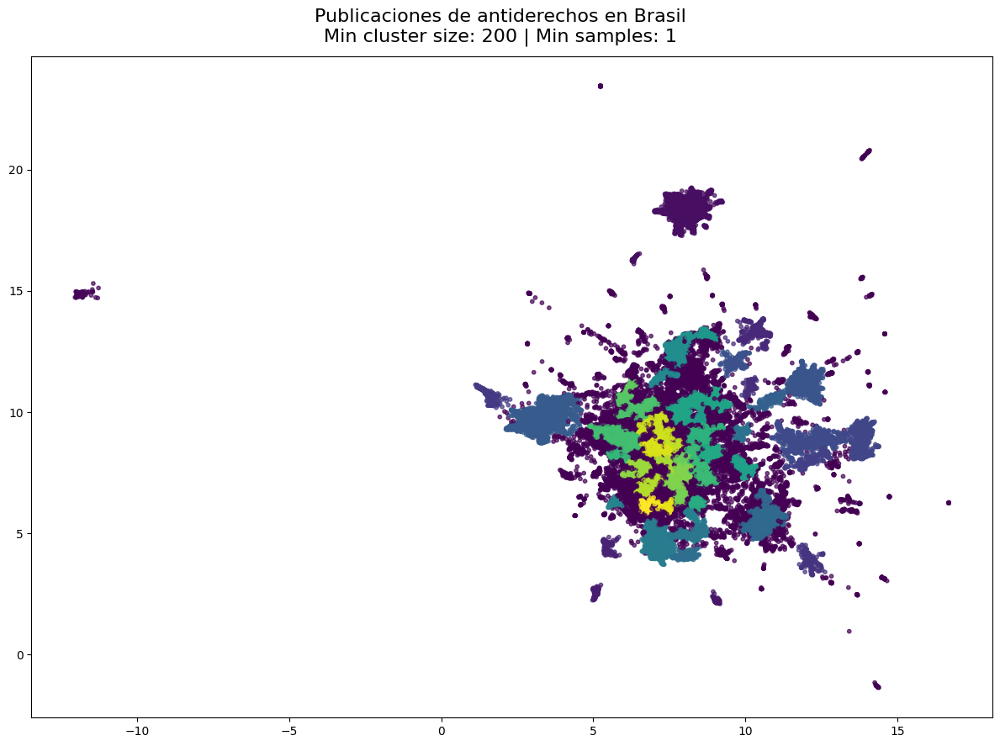

In [64]:
# Visualize clusters
plt.figure(figsize=(12,9))
plt.scatter(vecs_umap[:,0], vecs_umap[:,1], alpha=0.7, c=db_model.labels_, s=10)
plt.suptitle(f"Publicaciones de antiderechos en Brasil\nMin cluster size: {mc_size} | Min samples: {m_samples}", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/brasil/brasil_clusters")
plt.show()

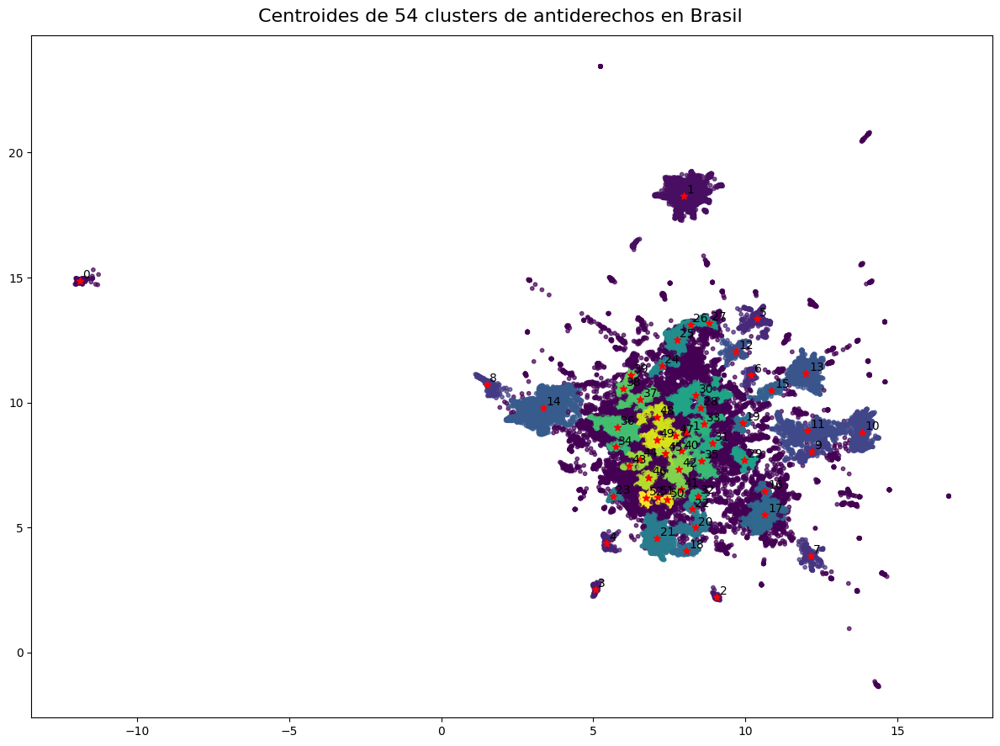

In [65]:
# Extract the centroid of each cluster

cl_centroids = {}

for i in sorted(country["CLUSTER"].unique()):

  cl_centroids[i] = country[country["CLUSTER"] == i][["COMP_1", "COMP_2"]].mean().values

centroids_array = np.array(list(cl_centroids.values()))

fig, ax = plt.subplots(figsize=(12,9))
ax.scatter(vecs_umap[:,0], vecs_umap[:,1], s=10, alpha=0.7, c=db_model.labels_)
ax.scatter(centroids_array[:,0], centroids_array[:,1], marker="*", c="red")
for i in cl_centroids:
  ax.annotate(i, cl_centroids.get(i)+np.array([0.1, 0.1]))
plt.suptitle(f"Centroides de {len(cl_centroids)} clusters de antiderechos en Brasil", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/brasil/brasil_centroids", dpi=fig.dpi)
plt.show()

In [66]:
from sklearn.metrics.pairwise import euclidean_distances

N = 10

for i in cl_centroids:
  point = cl_centroids.get(i).reshape(1,-1)
  ix_min_dist = np.argsort(euclidean_distances(point, country.loc[:, ["COMP_1", "COMP_2"]])).flatten()[:N]
  print(f"Tweets más representativos del cluster {i}")
  print(country.iloc[ix_min_dist, 
                      country.columns.get_loc("text_clean")].values, "\n")

Tweets más representativos del cluster -1
['Na revista Istoé desta semana, confira minha entrevista à publicação.'
 'Acesse e bombardeie com msgs dizendo q a revista Época me ridiculariza com essa deturpação da minha fala.'
 'Revista época mostra marmelada de Lula a favor de empreiteiros, e agora? Uma vergonha se esse indivíduo não for denunciado.Estamos esperando'
 'Quantos Pilates surgindo… Lavando as mãos perante uma decisão pra manter a aparência. Colherão o fruto de sua omissão.'
 '“Por causa da pandemia” é a desculpa mais usada pra tomar medidas sem noção.'
 'Sou livre para falar o q penso,a patrulha ideológica ñ vai me calar.'
 'Veja aqui a gravação da minha entrevista'
 'CRIVELLA já deu o troco,Freixo querendo colocar no colo dele, a imensa gama de verdades espalhadas na internet sobre ele.SÓ KKKKKKKKKKKKKKKK'
 'Teoria no meio cientifico é uma hipótese ñ comprovada.'
 'Alerta a todos,para RT > o PT nacional contratou um exercito para atuar na internet, afim de combater as opini